In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%pip install h5py
%pip install typing-extensions
%pip install wheel



%cd yolov5
#!pip freeze > requirements.txt
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 16525, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 16525 (delta 0), reused 1 (delta 0), pack-reused 16522
Receiving objects: 100% (16525/16525), 15.00 MiB | 24.62 MiB/s, done.
Resolving deltas: 100% (11359/11359), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 749.5/749.5 kB 25.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 45.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 53.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 71.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.2 MB/s eta 

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="alK8EEqJGxv5cm4KiuF0")
project = rf.workspace("nadim-ahmed").project("circuit-component-detection-9wiz7")
version = project.version(9)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.1.44, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Circuit-Component-Detection-9 in yolov8:: 100%|██████████| 1234/1234 [00:00<00:00, 4381.03it/s]


In [ ]:
from roboflow import Roboflow
#rf = Roboflow(model_format="yolov5", notebook="ultralytics")

# Replace 'YOUR_API_KEY' with your actual Roboflow API key
api_key = 'alK8EEqJGxv5cm4KiuF0'

# Initialize Roboflow object with API key
rf = Roboflow(api_key=api_key, model_format="yolov5", notebook="ultralytics")

In [ ]:
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [8]:
!python train.py --img 416 --batch 16 --epochs 10 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

2024-04-07 06:13:11.979664: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-07 06:13:11.979857: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-07 06:13:11.982986: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Circuit-Component-Detection-9/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device

In [9]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [10]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Circuit-Component-Detection-9/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-296-gae4ef3b2 Python-3.10.12 torch-2.2.1+cu121 CPU

Fusing layers... 
Model summary: 157 layers, 7031701 parameters, 0 gradients, 15.8 GFLOPs
image 1/19 /content/yolov5/Circuit-Component-Detection-9/test/images/hayder_10_2_png.rf.096d113736a64b11ece641e7a94b19f7.jpg: 416x416 1 Capacitor, 1 GND, 2 I_DCs, 2 Resistors, 3 V_DCs, 190.9ms
image 2/19 /content/yolov5/Circuit-Component-Detection-9/test/images/hayder_12_2_png.rf.e5e0f88dfa65374a172b0c6c0c0d131c.jp

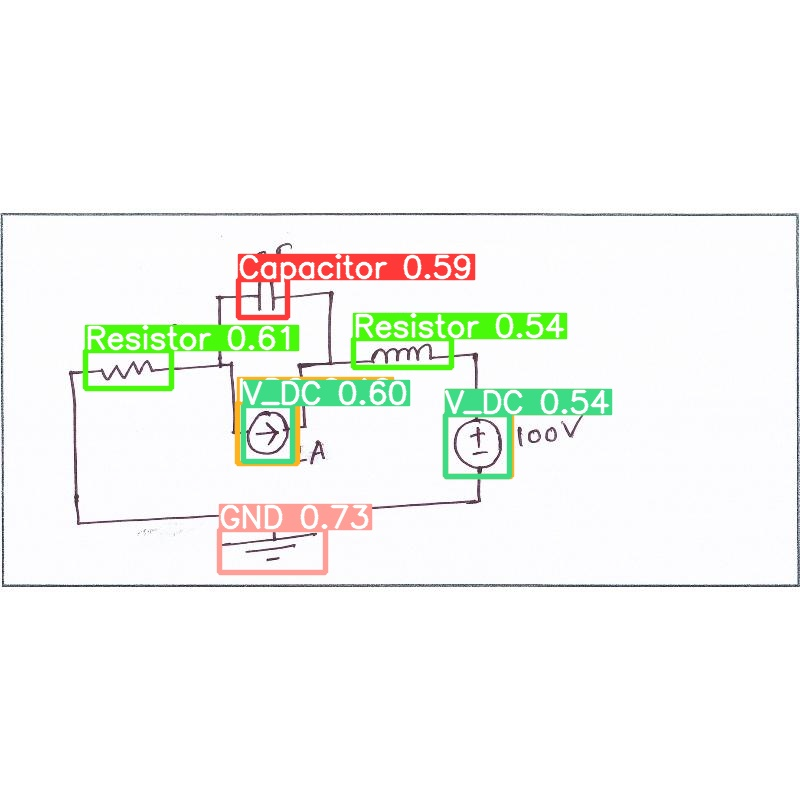

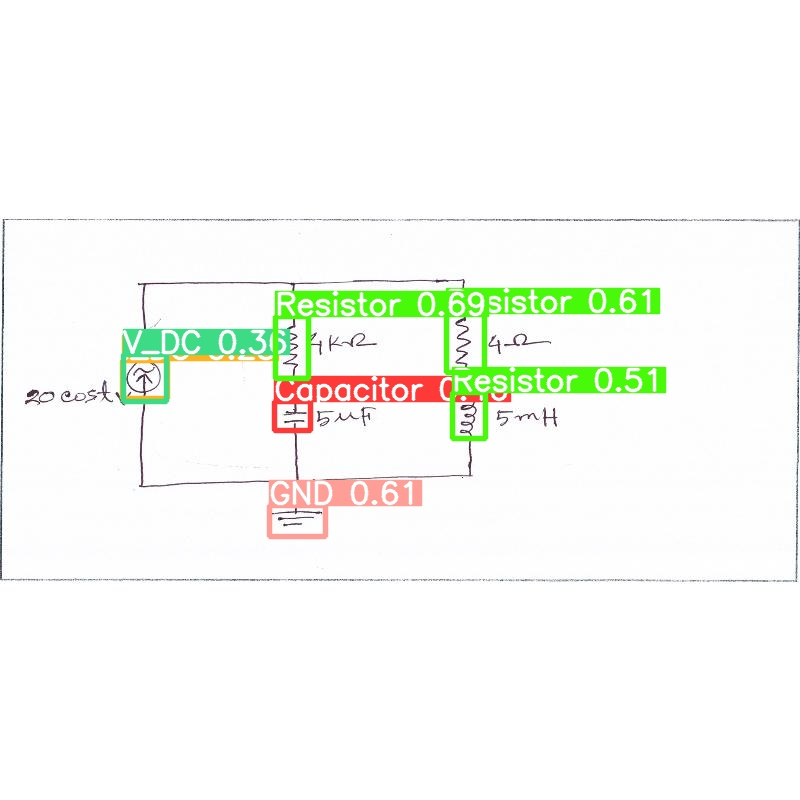

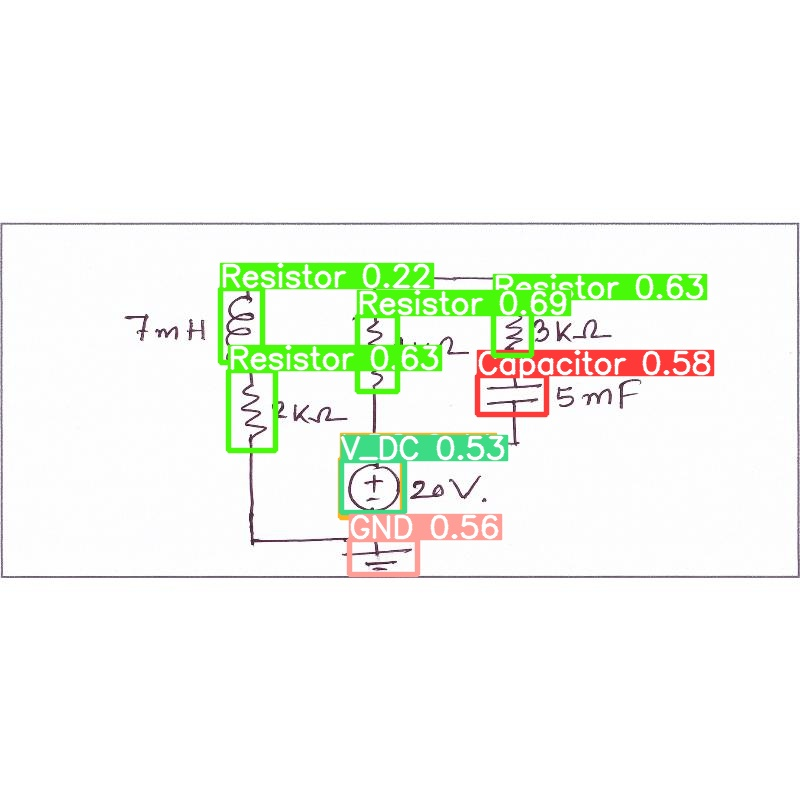

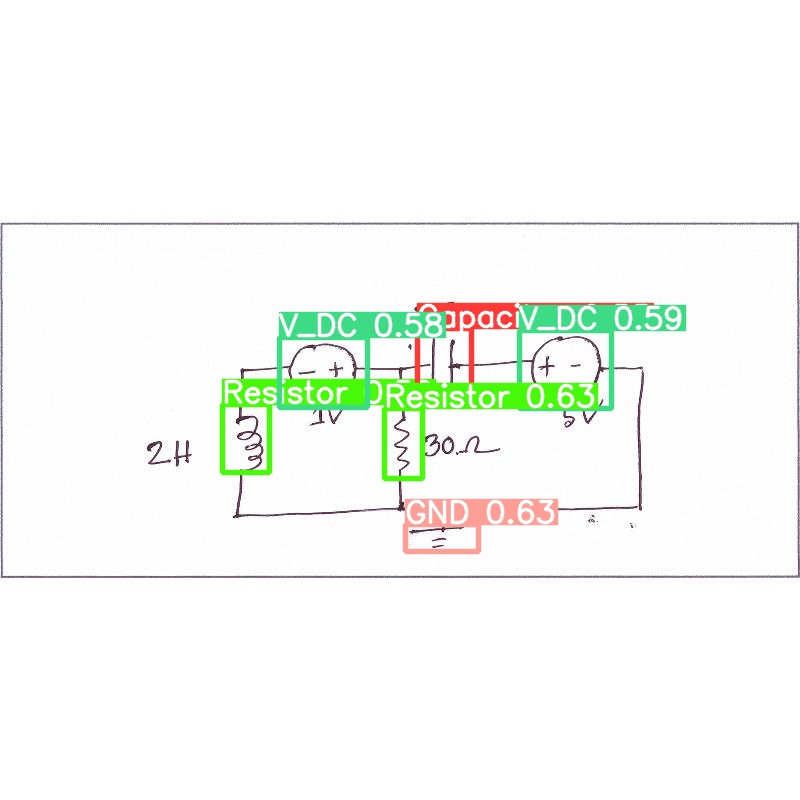

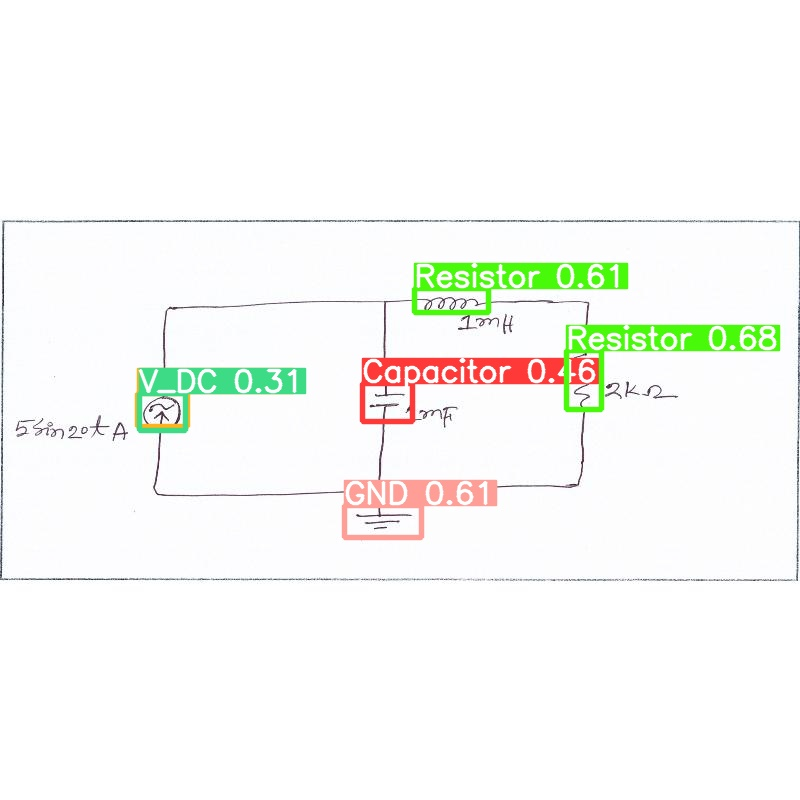

...

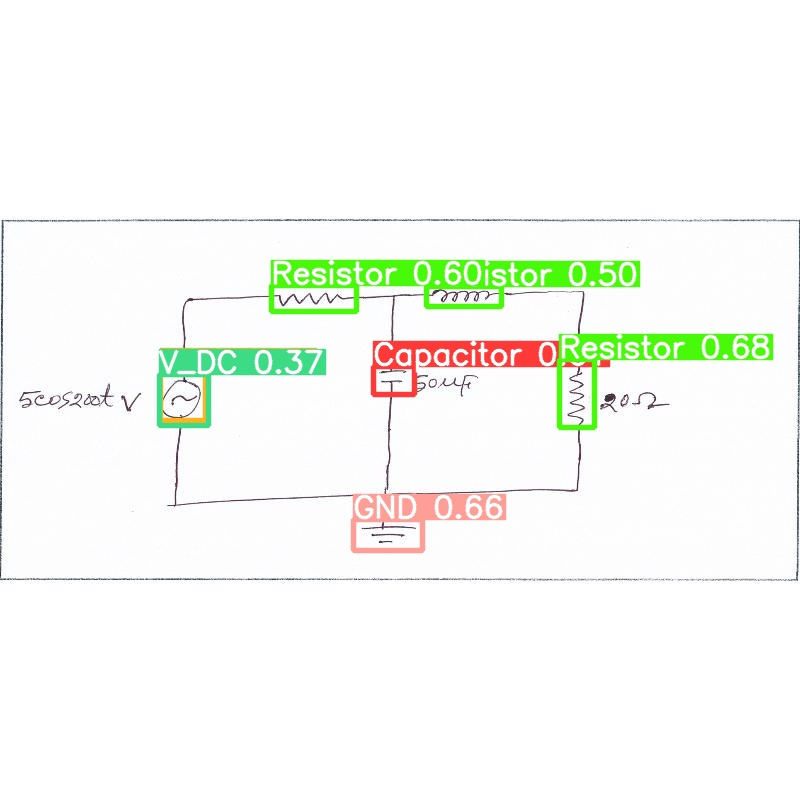

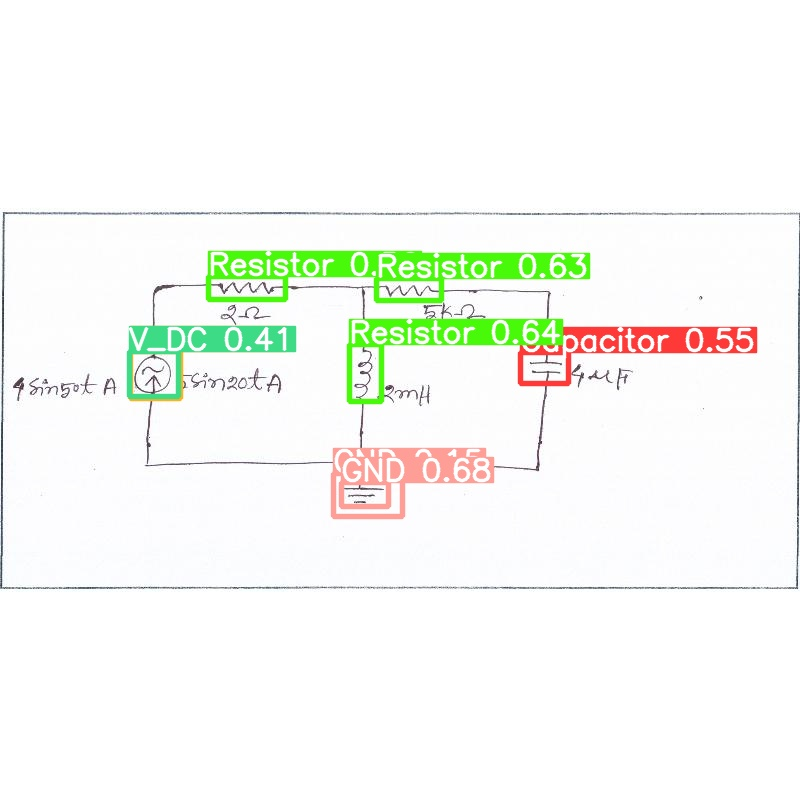

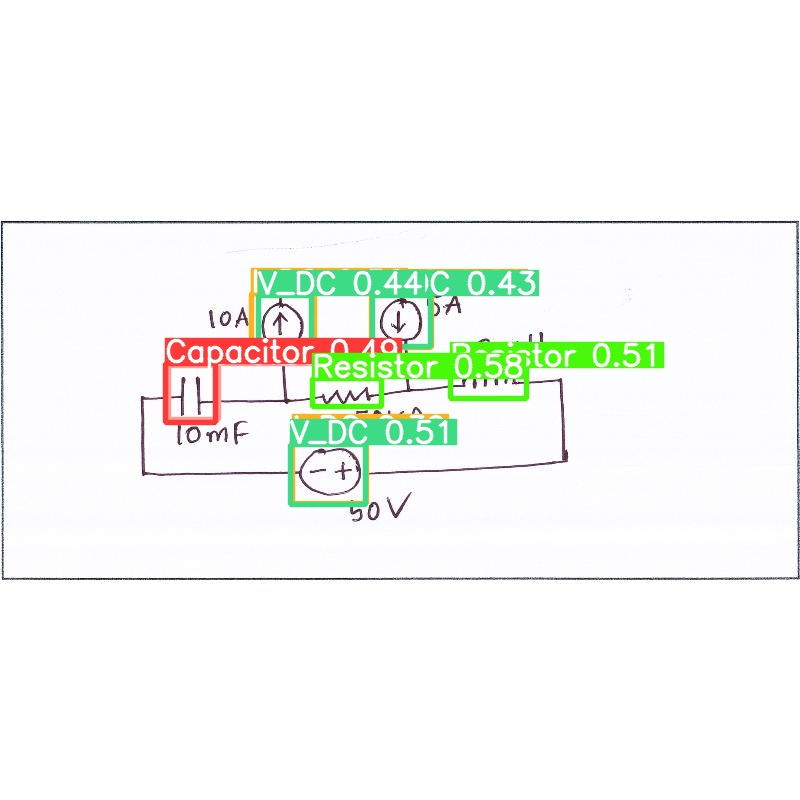

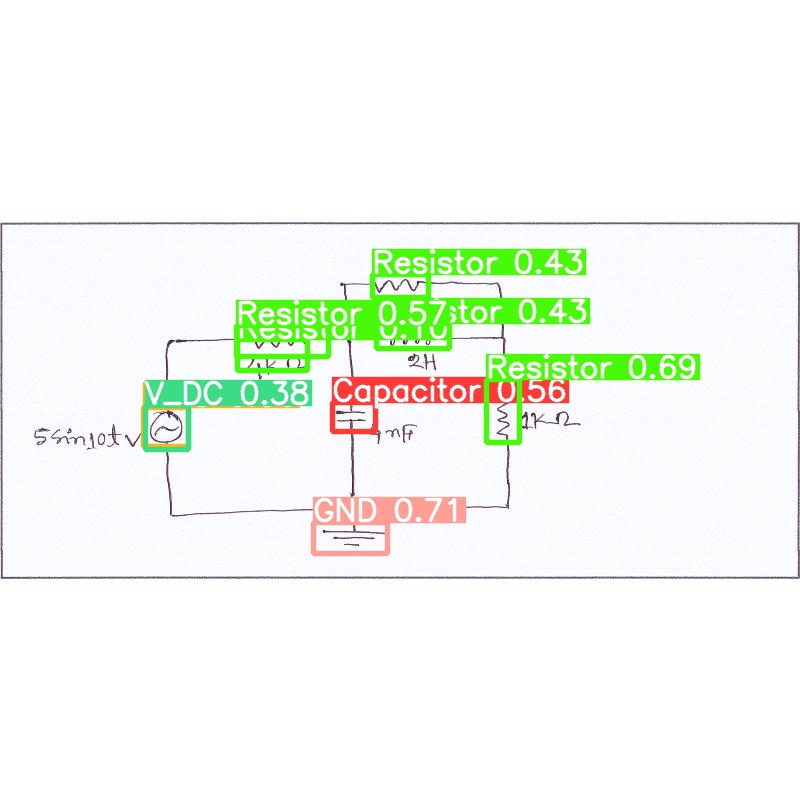

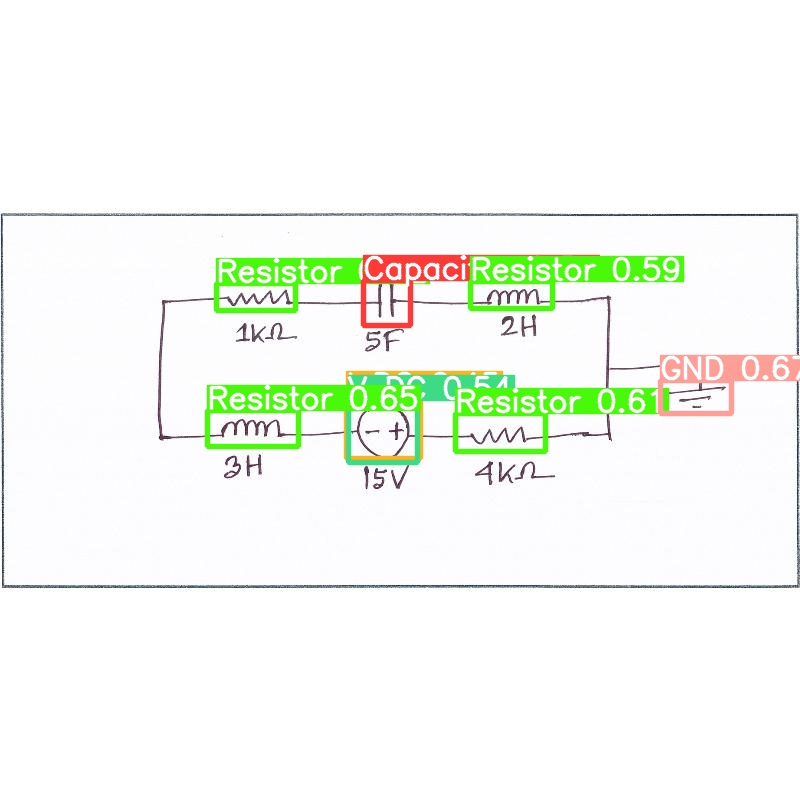

In [13]:

#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")